In [1]:
# Script for training a denoiser on Massive Nu
import os
os.environ["CUDA_VISIBLE_DEVICES"]="2"

from absl import app
from absl import flags
import haiku as hk
import jax
from jax.experimental import optix
import jax.numpy as jnp
import numpy as onp
import pickle
from functools import partial

from flax.metrics import tensorboard

# Import tensorflow for dataset creation and manipulation
import tensorflow.compat.v2 as tf
tf.enable_v2_behavior()
import tensorflow_datasets as tfds

from jax_lensing.datasets.massivenu import MassiveNu
from jax_lensing.models.convdae import SmallUResNet
from jax_lensing.models.normalization import SNParamsTree as CustomSNParamsTree
from jax_lensing.spectral import make_power_map

In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
def load_dataset(batch_size, noise_dist_std, train_split):
  def pre_process(im):
    """ Pre-processing function preparing data for denoising task
    """
    # Cutout a portion of the map
    x = tf.image.random_crop(tf.expand_dims(im['map'],-1), [320,320,1])
    x = tf.image.random_flip_left_right(x)
    x = tf.image.random_flip_up_down(x)
    # Sample random Gaussian noise
    u = tf.random.normal(tf.shape(x))
    # Sample standard deviation of noise corruption
    s = noise_dist_std * tf.random.normal((1, 1, 1))
    # Create noisy image
    y = x + s * u
    return {'x':x, 'y':y, 'u':u,'s':s}
  ds = tfds.load('massive_nu', split='train[:%s]'%train_split, shuffle_files=True)
  ds = ds.shuffle(buffer_size=10*batch_size)
  ds = ds.repeat()
  ds = ds.map(pre_process)
  ds = ds.batch(batch_size)
  ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
  return iter(tfds.as_numpy(ds))

def forward_fn(x, s, is_training=False):
  denoiser = SmallUResNet(n_output_channels=1)
  return denoiser(x, s, is_training=is_training)

def log_gaussian_prior(map_data, sigma, ps_map):
  data_ft = jnp.fft.fft2(map_data) / 320.
  return -0.5*jnp.sum(jnp.real(data_ft*jnp.conj(data_ft)) / (ps_map+sigma[0]**2))
gaussian_prior_score = jax.vmap(jax.grad(log_gaussian_prior), in_axes=[0,0, None])

In [4]:
# Make the network
model = hk.transform_with_state(forward_fn)

rng_seq = hk.PRNGSequence(42)

params, state = model.init(next(rng_seq),
                         jnp.zeros((1, 320, 320, 2)),
                         jnp.zeros((1, 1, 1, 1)), is_training=True)

# If the Gaussian prior is used, load the theoretical power spectrum

ps_data = onp.load('../data/massivenu/mnu0.0_Maps10_PS_theory.npy').astype('float32')
ell = jnp.array(ps_data[0,:])
ps_halofit = jnp.array(ps_data[4,:] / 0.000116355**2) # normalisation by pixel size
# convert to pixel units of our simple power spectrum calculator
kell = ell / (360/3.5/0.5) / 320
# Interpolate the Power Spectrum in Fourier Space
power_map = jnp.array(make_power_map(ps_halofit, 320, kps=kell))

In [5]:
# Load dataset
train = load_dataset(16, 0.05, "80%")

In [6]:
# Saving params
import pickle

with open('/data/Scores/lensing/training_kl1_gaussian_01noise/model-final.pckl', 'rb') as file:
    params, state, sn_state = pickle.load(file)

In [7]:
from functools import partial
score = partial(model.apply, params, state, next(rng_seq))

In [8]:
batch = next(train)

In [9]:
def score_fn(params, state, rng_key, batch, is_training=True):
  # If requested, first compute the Gaussian prior
  gaussian_score = gaussian_prior_score(batch['y'][...,0], batch['s'][...,0], power_map)
  gaussian_score = jnp.expand_dims(gaussian_score, axis=-1)
  net_input = jnp.concatenate([batch['y'], jnp.abs(batch['s'])**2 * gaussian_score],axis=-1)
  res, state = model.apply(params, state, rng_key, net_input , batch['s'], is_training=is_training)
  return batch, res, gaussian_score

In [10]:
batch, res, gs = score_fn(params, state, next(rng_seq), batch)

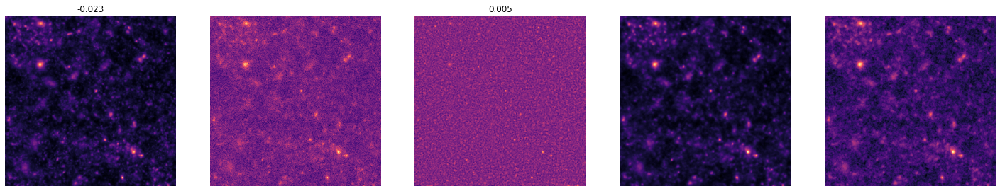

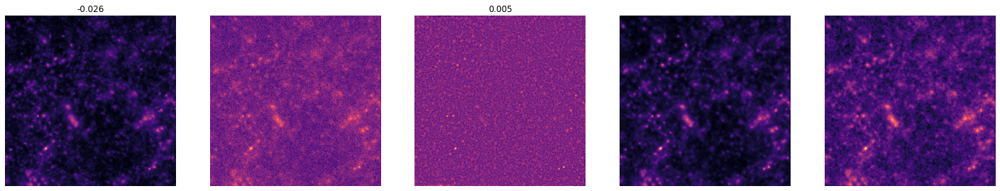

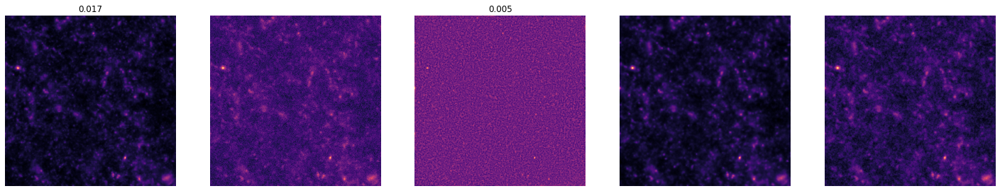

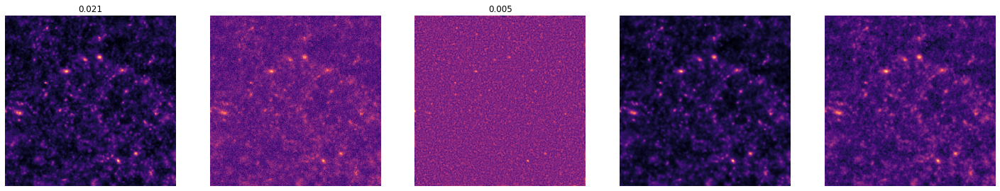

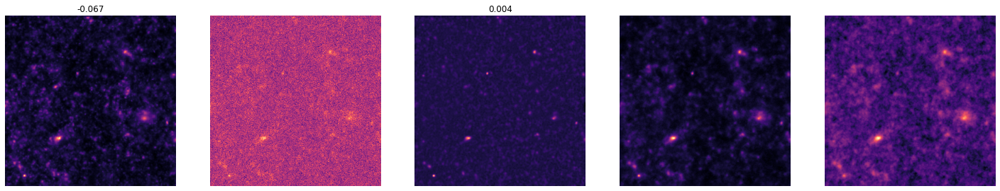

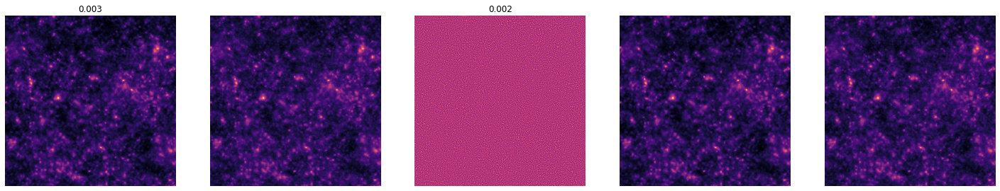

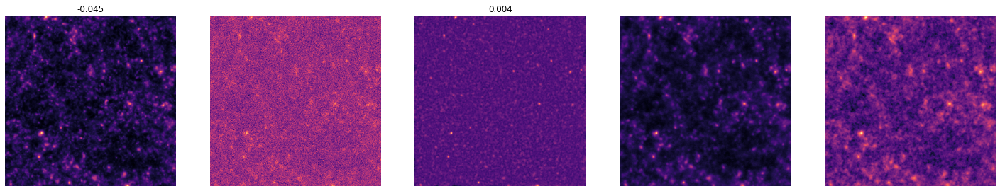

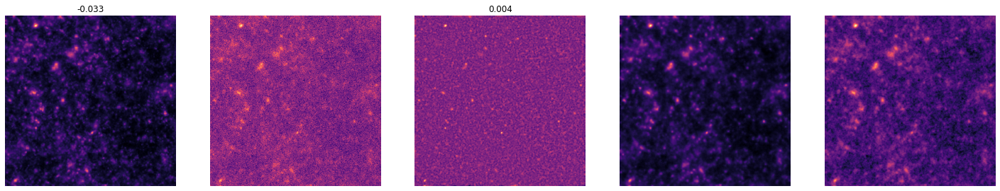

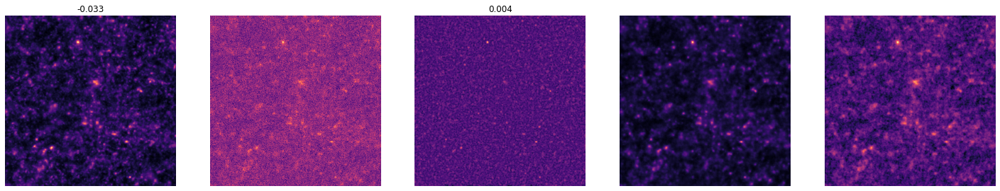

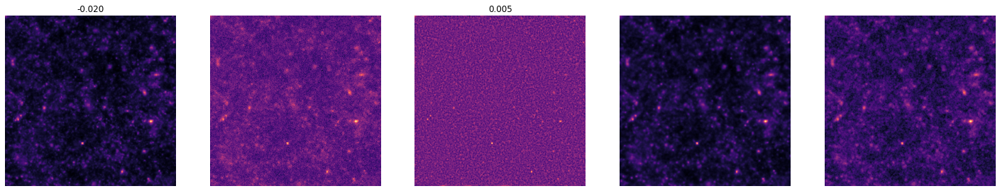

In [11]:
for i in range(10):
  ind = i
  figure(figsize=(25,5))
  subplot(151)
  title("%0.3f"%batch['s'][ind,0,0,0])
  imshow(batch['x'][ind,...,0],cmap='magma')
  axis('off')
  subplot(152)
  imshow(batch['y'][ind,...,0],cmap='magma')
  axis('off')
  subplot(153)
  imshow(res[ind,...,0],cmap='magma')
  axis('off')
  title("%0.3f"%std(batch['s'][ind,:,:,0]**2 *res[ind,...,0]))
  subplot(154)
  imshow(batch['y'][ind,...,0] + batch['s'][ind,:,:,0]**2 * (gs[ind,...,0] + res[ind,...,0] ),cmap='magma')
  axis('off')
  subplot(155)
  imshow(batch['y'][ind,...,0] + batch['s'][ind,:,:,0]**2 * (gs[ind,...,0]),cmap='magma')
  axis('off')

## First sample without likelihood term

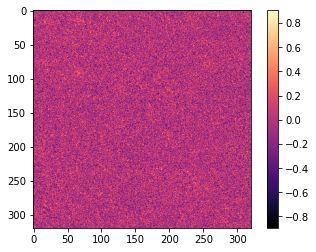

In [23]:
noise =0.2
init_image=( batch['x'][0].reshape((1,320,320)) + noise*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
imshow(init_image.reshape((320,320)), cmap='magma')
colorbar()

In [24]:
from jax_lensing.spectral import measure_power_spectrum

In [25]:
@jax.jit
def score_fn(x, sigma=jnp.ones([1])*0.01):
  gs = gaussian_prior_score(x.reshape((-1,320,320)), sigma.reshape((-1,1,1)), power_map)
  gs = jnp.expand_dims(gs, axis=-1)
  net_input = jnp.concatenate([x.reshape((-1,320,320,1)), jnp.abs(sigma.reshape((-1,1,1,1)))**2 * gs],axis=-1)
  res, _ = score(net_input , sigma.reshape((-1,1,1,1)), is_training=True)
  return (  gs[...,0] + res[...,0] # <- YOU CAN COMMENT RES HERE TO GET A GAUSSIAN SAMPLE
           # - score_likelihood(x.reshape((-1,320,320,1)), sigma.reshape((-1,1,1,1)))
          ).reshape(( 320*320))

In [26]:
@jax.jit
def dynamics(t, x):
  x = x.reshape([-1,320,320])
  return - 0.5*score_fn(x, sigma=jnp.ones([1])*jnp.sqrt(t)).reshape([-1])

In [27]:
from scipy import integrate

In [28]:
start_and_end_times = jnp.logspace(log10(0.99*noise**2),-7)

solution = integrate.solve_ivp(dynamics, 
                               [noise**2,(0.0)], 
                               init_image.flatten(),
                               t_eval=start_and_end_times)

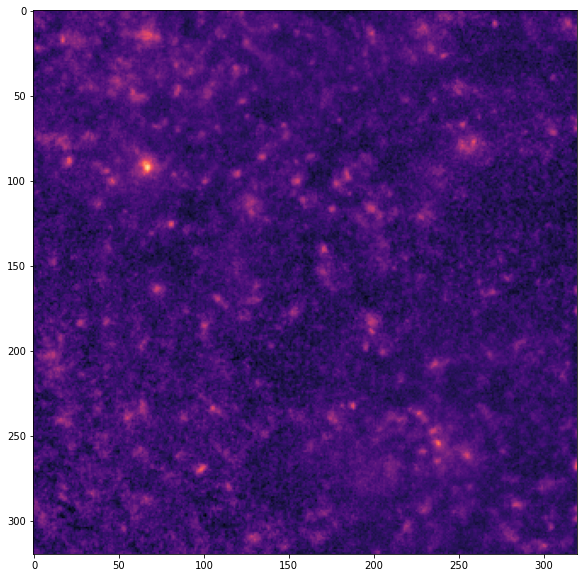

In [29]:
figure(figsize=[10,10])
imshow(solution.y[:,-1].reshape([320,320]), cmap='magma',vmax=0.25)

Text(0.5, 1.0, 'Target noise')

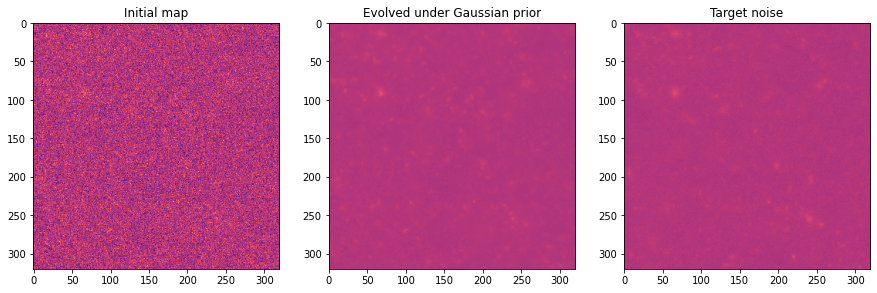

In [30]:
figure(figsize=[15,5])
subplot(131)
imshow(solution.y[:,0].reshape((320,320)), cmap='magma',vmin=init_image.min(),vmax=init_image.max())
title('Initial map')
subplot(132)
imshow(solution.y[:,-1].reshape((320,320)), cmap='magma',vmin=init_image.min(),vmax=init_image.max())
title('Evolved under Gaussian prior')
subplot(133)
test_image=( batch['x'][0].reshape((1,320,320)) + 0.02*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
imshow(test_image.reshape((320,320)), cmap='magma',vmin=init_image.min(),vmax=init_image.max() )
title('Target noise')

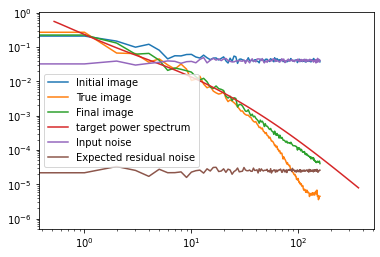

In [33]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='True image')
loglog(measure_power_spectrum(solution.y[:,-1].reshape((320,320))), label='Final image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( 0.2*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Input noise')
loglog(measure_power_spectrum( 0.005*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
legend()

In [112]:
# Now  try to denoise final step

In [41]:
res_noise= 0.012 # This can be tuned..
final_image = score_fn(solution.y[:,-1], sigma=jnp.ones([1])*res_noise)
final_image = (solution.y[:,-1] + res_noise**2 * final_image).reshape((320,320))

Text(0.5, 1.0, 'true image')

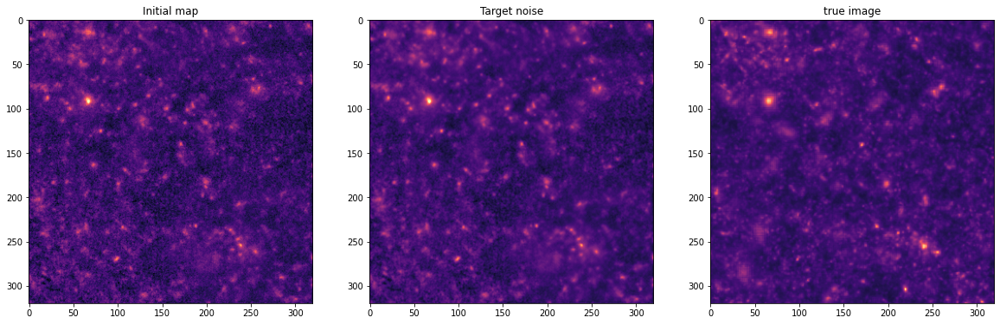

In [44]:
test_image=( batch['x'][0].reshape((1,320,320)) + 0*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
figure(figsize=[20,10])
subplot(131)
imshow(solution.y[:,-1].reshape((320,320)), cmap='magma',vmin=-.06,vmax=test_image.max())
title('Initial map')
subplot(132)
imshow(final_image.reshape((320,320)), cmap='magma',vmin=-0.06,vmax=test_image.max() )
title('Target noise')
subplot(133)
imshow(test_image.reshape((320,320)), cmap='magma',vmin=-0.06,vmax=test_image.max() )
title('true image')

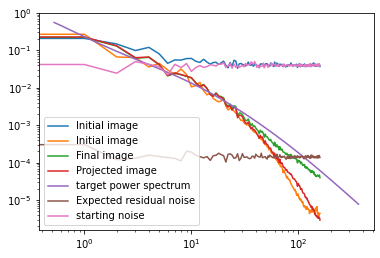

In [43]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(solution.y[:,-1].reshape((320,320))), label='Final image')
loglog(measure_power_spectrum(final_image.reshape((320,320))), label='Projected image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( res_noise*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
loglog(measure_power_spectrum( 0.2*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='starting noise')
legend()

## Testing with likelhiood term

In [161]:
from lenspack.utils import bin2d
from lenspack.image.inversion import ks93
from lenspack.peaks import find_peaks2d
from jax_lensing.inversion import ks93inv

# Load the mask et shear from COSMOS
from astropy.io import fits
mask = fits.getdata('../data/cosmos_mask_0.4arcmin.fits').astype('float32')
kappaE = batch['x'][0].reshape((320,320)) 

e1,e2 = ks93inv(kappaE,0*kappaE)

noise_gamma = 0.1
true_shear = jnp.stack([e1+ noise_gamma*randn(320,320), e2+ noise_gamma*randn(320,320)], axis=0).flatten() 

def likelihood_fn(x, sigma):
    x = x.reshape((320, 320,2))
    ke = x[...,0]
    kb = x[...,1]
    sigma = sigma[0]
    
    gamma1, gamma2 = ks93inv(ke, kb)
    masked_gamma1, masked_gamma2 = mask.reshape((320, 320))*gamma1, gamma2*mask.reshape((320, 320))
    shear = jnp.stack([masked_gamma1, masked_gamma2], axis=0).flatten()
    m = 1. - jnp.stack([mask.reshape((320,320))]*2, axis=0).flatten()
    return jnp.sum( ((shear-true_shear)**2/(noise_gamma**2 + sigma**2 +m*10**2)) )/2.

score_likelihood = jax.vmap(jax.grad(likelihood_fn))

In [162]:

def log_gaussian_prior_b(map_data, sigma):
  data_ft = jnp.fft.fft2(map_data) / 320.
  return -0.5*jnp.sum(jnp.real(data_ft*jnp.conj(data_ft)) / (sigma[0]**2))

gaussian_prior_score_b = jax.vmap(jax.grad(log_gaussian_prior_b), in_axes=[0,0])

In [163]:
@jax.jit
def score_fn(x, sigma=jnp.ones([1])*0.01):
  x = x.reshape((-1,320,320,2))
  ke = x[...,0]
  kb = x[...,1]
  gs = gaussian_prior_score(ke, sigma.reshape((-1,1,1)), power_map)
  gs = jnp.expand_dims(gs, axis=-1)
  gsb = gaussian_prior_score_b(kb, sigma.reshape((-1,1,1)))
  gsb = jnp.expand_dims(gsb, axis=-1)

  net_input = jnp.concatenate([ke.reshape((-1,320,320,1)), jnp.abs(sigma.reshape((-1,1,1,1)))**2 * gs],axis=-1)
  res, _ = score(net_input , sigma.reshape((-1,1,1,1)), is_training=True)
  return (  jnp.stack([gs[...,0], gsb[...,0]],axis=-1) + jnp.stack([res[...,0], jnp.zeros_like(res[...,0])],axis=-1)
            - score_likelihood(x, sigma.reshape((-1,1,1,1)))
          ).reshape(( 320*320*2))

In [164]:
@jax.jit
def dynamics(t, x):
  x = x.reshape([-1,320,320,2])
  return - 0.5*score_fn(x, sigma=jnp.ones([1])*jnp.sqrt(t)).reshape([-1])

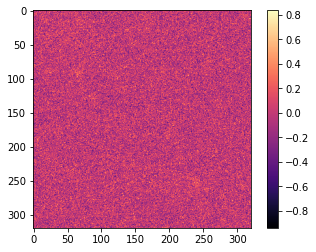

In [165]:
noise = 0.2

#ke_init,kb_init = ks93(true_shear.reshape((2,320,320))[0], true_shear.reshape((2,320,320))[1])
                       
init_image=( jnp.stack([kappaE,kappaE*0],axis=-1) + noise*randn(320,320,2))#.reshape((-1, 320*320,)).astype('float32')
init_image = init_image.reshape((-1, 320*320,2)).astype('float32')

#init_image = jnp.stack(),axis=-1).reshape((-1, 320*320,2)).astype('float32')
imshow(init_image.reshape((320,320,2))[...,0], cmap='magma')
colorbar()

In [166]:
start_and_end_times = jnp.logspace(log10(0.99*noise**2),-7)

solution = integrate.solve_ivp(dynamics, 
                               [noise**2,(0.0)], 
                               init_image.flatten(),
                               t_eval=start_and_end_times)

(1e-06, 1)

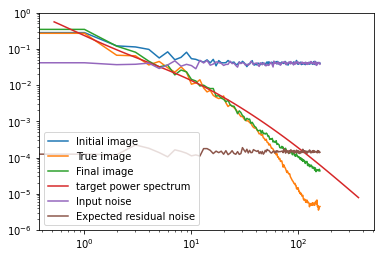

In [167]:
loglog(measure_power_spectrum(init_image.reshape((320,320,2))[...,0]), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='True image')
loglog(measure_power_spectrum(solution.y[:,-1].reshape((320,320,2))[...,0]), label='Final image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( 0.2*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Input noise')
loglog(measure_power_spectrum( 0.012*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
legend()
ylim(1.e-6,1)

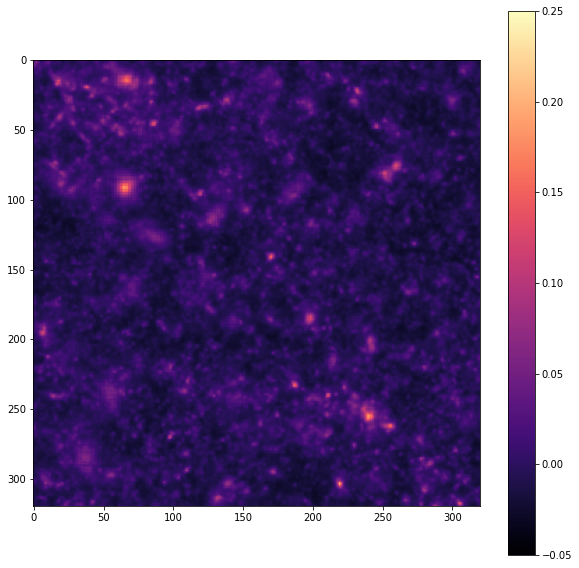

In [168]:
figure(figsize=[10,10])
imshow(batch['x'][0].reshape((320,320)), cmap='magma',vmax=0.25,vmin=-0.05);colorbar()

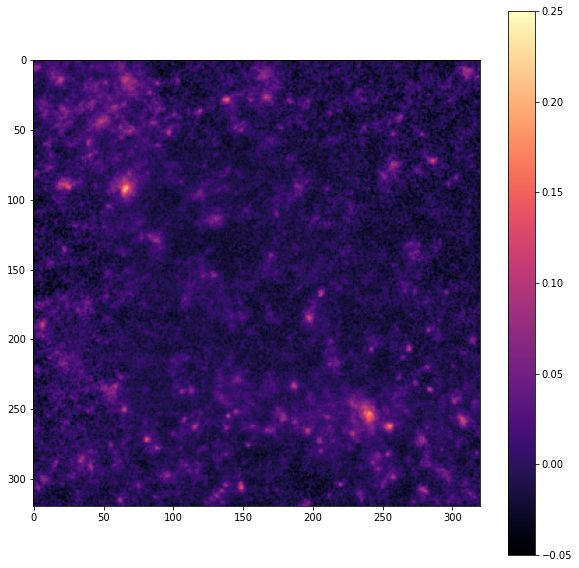

In [169]:
figure(figsize=[10,10])
imshow(solution.y[:,-1].reshape((320,320,2))[...,0], cmap='magma',vmax=0.25,vmin=-0.05);colorbar()

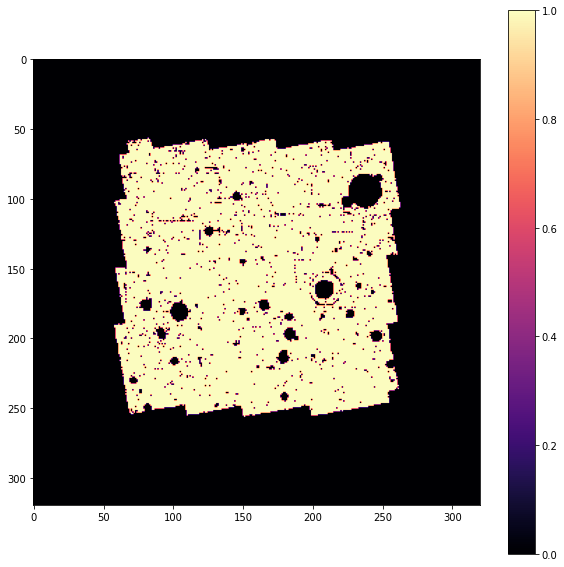

In [175]:
figure(figsize=[10,10])
imshow(mask, cmap='magma');colorbar()

In [176]:
# Now  try to denoise final step

In [177]:
res_noise= 0.012
final_image = score_fn(solution.y[:,-1], sigma=jnp.ones([1])*res_noise)
final_image = (solution.y[:,-1] + res_noise**2 * final_image).reshape((320,320,2))

Text(0.5, 1.0, 'true image')

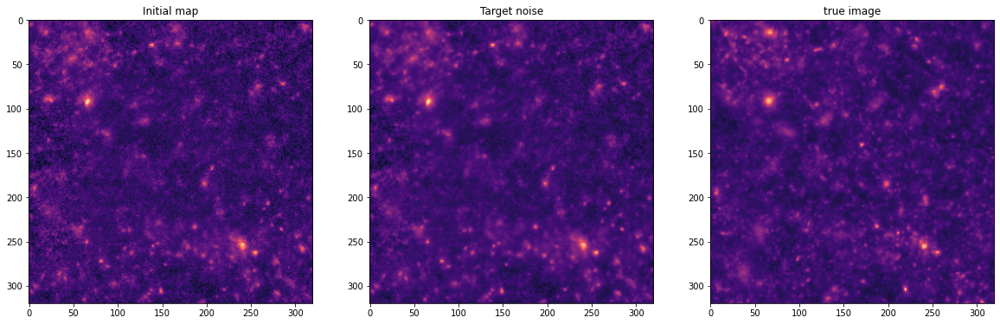

In [178]:
test_image=( batch['x'][0].reshape((1,320,320)) + 0*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
figure(figsize=[20,10])
subplot(131)
imshow(solution.y[:,-1].reshape((320,320,2))[...,0], cmap='magma',vmin=-.06,vmax=test_image.max())
title('Initial map')
subplot(132)
imshow(final_image.reshape((320,320,2))[...,0], cmap='magma',vmin=-0.06,vmax=test_image.max() )
title('Target noise')
subplot(133)
imshow(test_image.reshape((320,320)), cmap='magma',vmin=-0.06,vmax=test_image.max() )
title('true image')

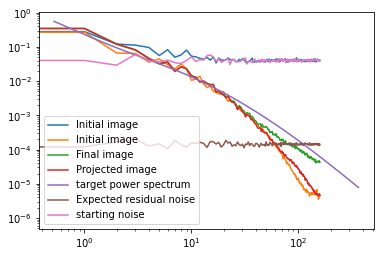

In [179]:
loglog(measure_power_spectrum(init_image.reshape((320,320,2))[...,0]), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(solution.y[:,-1].reshape((320,320,2))[...,0]), label='Final image')
loglog(measure_power_spectrum(final_image.reshape((320,320,2))[...,0]), label='Projected image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( res_noise*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
loglog(measure_power_spectrum( 0.2*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='starting noise')
legend()

## OLD STUFF BELOW

In [53]:
import jax
import jax.numpy as jnp
import tensorflow_probability as tfp; tfp = tfp.experimental.substrates.jax
from jax_lensing.samplers.score_samplers import ScoreHamiltonianMonteCarlo, ScoreMetropolisAdjustedLangevinAlgorithm

In [235]:
@jax.jit
def score_fn(x, sigma=jnp.ones([1])*0.01):
  gs = gaussian_prior_score(x.reshape((-1,320,320)), sigma.reshape((-1,1,1)), power_map)
  gs = jnp.expand_dims(gs, axis=-1)
  net_input = jnp.concatenate([x.reshape((-1,320,320,1)), jnp.abs(sigma.reshape((-1,1,1,1)))**2 * gs],axis=-1)
  res, _ = score(net_input , sigma.reshape((-1,1,1,1)), is_training=True)
  return (  gs[...,0] # + res[...,0]
           # - score_likelihood(x.reshape((-1,320,320,1)), sigma.reshape((-1,1,1,1)))
          ).reshape(( 320*320))

In [236]:
kernel = ScoreHamiltonianMonteCarlo(
      target_score_fn=score_fn,
      step_size=0.001,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

num_results = int(1e3)
num_burnin_steps = int(0)

samples, trace = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=init_image.reshape([-1]),
        kernel=kernel,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=0,
        trace_fn=lambda _, pkr: pkr.is_accepted,
        seed=jax.random.PRNGKey(0))

0.97400004


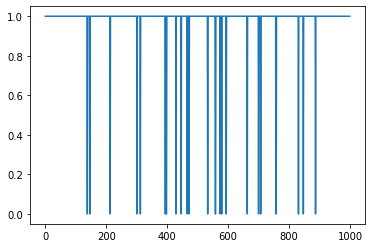

In [237]:
plot(trace); print(mean(trace))

Text(0.5, 1.0, 'Target noise')

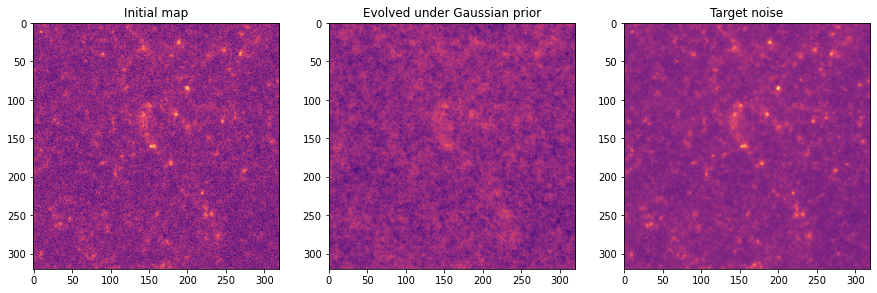

In [238]:
figure(figsize=[15,5])
subplot(131)
imshow(samples[0].reshape((320,320)), cmap='magma',vmin=samples[0].min(),vmax=test_image.max())
title('Initial map')
subplot(132)
imshow(samples[-1].reshape((320,320)), cmap='magma',vmin=samples[0].min(),vmax=test_image.max())
title('Evolved under Gaussian prior')
subplot(133)
test_image=( batch['x'][0].reshape((1,320,320)) + 0.01*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
imshow(test_image.reshape((320,320)), cmap='magma',vmin=samples[0].min(),vmax=test_image.max() )
title('Target noise')

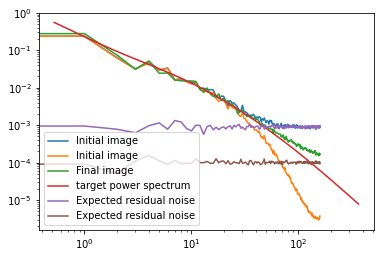

In [239]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( 0.03*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
loglog(measure_power_spectrum( 0.01*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
legend()

In [240]:
@jax.jit
def score_fn(x, sigma=jnp.ones([1])*0.01):
  gs = gaussian_prior_score(x.reshape((-1,320,320)), sigma.reshape((-1,1,1)), power_map)
  gs = jnp.expand_dims(gs, axis=-1)
  net_input = jnp.concatenate([x.reshape((-1,320,320,1)), jnp.abs(sigma.reshape((-1,1,1,1)))**2 * gs],axis=-1)
  res, _ = score(net_input , sigma.reshape((-1,1,1,1)), is_training=True)
  return (  gs[...,0] + res[...,0]
           # - score_likelihood(x.reshape((-1,320,320,1)), sigma.reshape((-1,1,1,1)))
          ).reshape(( 320*320))

In [241]:
kernel = ScoreHamiltonianMonteCarlo(
      target_score_fn=score_fn,
      step_size=0.0005,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

num_results = int(1e3)
num_burnin_steps = int(0)

samples, trace = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=init_image.reshape([-1]),
        kernel=kernel,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=0,
        trace_fn=lambda _, pkr: pkr.is_accepted,
        seed=jax.random.PRNGKey(0))

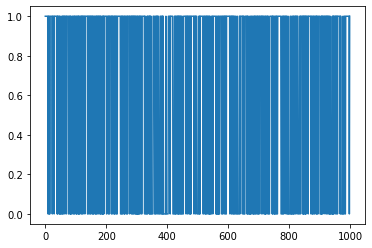

In [242]:
plot(trace)

In [243]:
print(mean(trace))

0.64000005


Text(0.5, 1.0, 'Target noise')

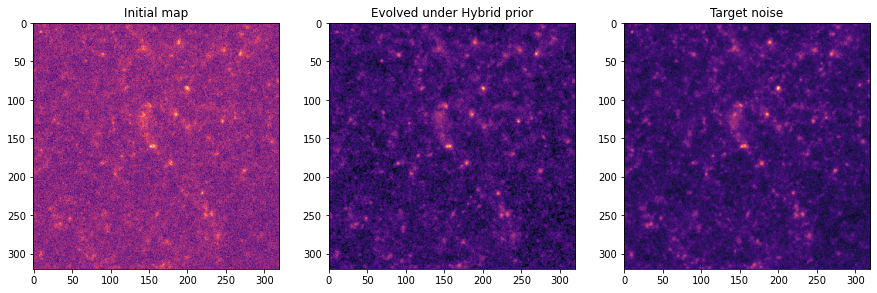

In [252]:
figure(figsize=[15,5])
subplot(131)
imshow(samples[0].reshape((320,320)), cmap='magma',vmin=samples[0].min(),vmax=test_image.max())
title('Initial map')
subplot(132)
imshow(samples[-1].reshape((320,320)), cmap='magma',vmin=test_image.min(),vmax=test_image.max())
title('Evolved under Hybrid prior')
subplot(133)
test_image=( batch['x'][0].reshape((1,320,320)) + 0.01*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
imshow(test_image.reshape((320,320)), cmap='magma',vmin=test_image.min(),vmax=test_image.max() )
title('Target noise')

In [114]:
from jax_lensing.spectral import measure_power_spectrum

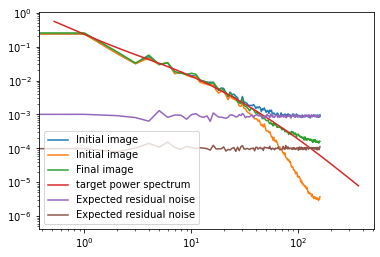

In [248]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( 0.03*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
loglog(measure_power_spectrum( 0.01*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
legend()

In [271]:
final_image = score_fn(samples[-1])
final_image = (samples[-1] + 0.01**2 * final_image).reshape((320,320))

Text(0.5, 1.0, 'Target noise')

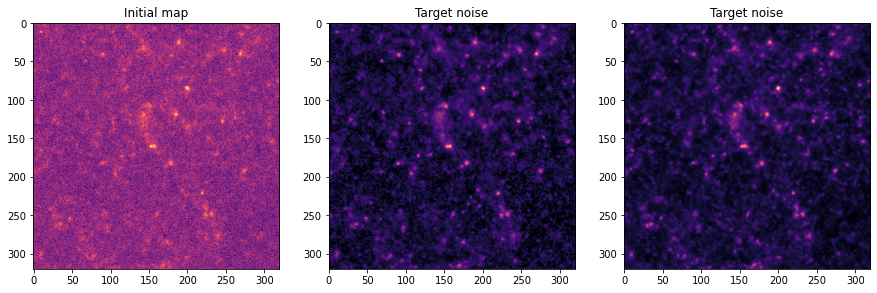

In [273]:
test_image=( batch['x'][0].reshape((1,320,320)) + 0.00*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
figure(figsize=[15,5])
subplot(131)
imshow(samples[0].reshape((320,320)), cmap='magma',vmin=samples[0].min(),vmax=test_image.max())
title('Initial map')
subplot(132)
imshow(final_image.reshape((320,320)), cmap='magma',vmin=test_image.min(),vmax=test_image.max() )
title('Target noise')
subplot(133)
imshow(test_image.reshape((320,320)), cmap='magma',vmin=test_image.min(),vmax=test_image.max() )
title('Target noise')

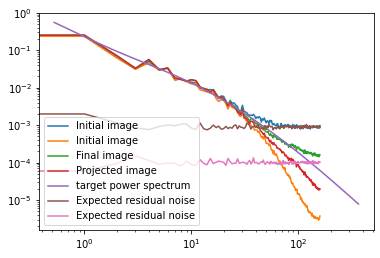

In [267]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(measure_power_spectrum(final_image.reshape((320,320))), label='Projected image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( 0.03*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
loglog(measure_power_spectrum( 0.01*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
legend()

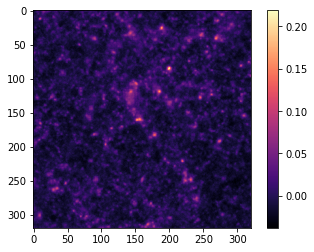

In [126]:
test_image=( batch['x'][0].reshape((1,320,320)) + 0.003*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
imshow(test_image.reshape((320,320)), cmap='magma')
colorbar()

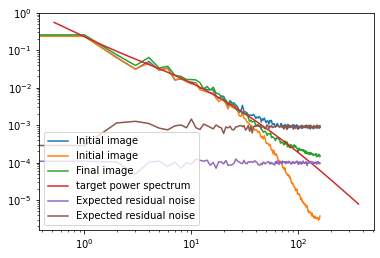

In [111]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Initial image')

loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(kell*320,ps_halofit, label='target power spectrum')
loglog(measure_power_spectrum( 0.01*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')
loglog(measure_power_spectrum( 0.03*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')

legend()

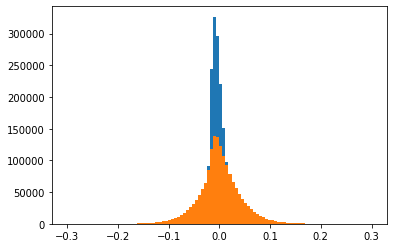

In [47]:
hist(batch['x'].reshape(-1),100,range=[-0.3, 0.3]);
hist(batch['y'].reshape(-1),100,range=[-0.3, 0.3]);

In [31]:
std(batch['x'].reshape(-1))

0.01746684

In [228]:
@jax.jit
def score_fn(x, sigma):
  gs = gaussian_prior_score(x.reshape((-1,320,320)), sigma.reshape((-1,1,1)), power_map)
  gs = jnp.expand_dims(gs, axis=-1)
  net_input = jnp.concatenate([x.reshape((-1,320,320,1)), jnp.abs(sigma.reshape((-1,1,1,1)))**2 * gs],axis=-1)
  res, _ = score(net_input , sigma.reshape((-1,1,1,1)), is_training=True)
  print(gs.shape, res.shape)
  return (  gs[...,0] + res[...,0]
           # - score_likelihood(x.reshape((-1,320,320,1)), sigma.reshape((-1,1,1,1)))
          ).reshape((-1, 320*320))

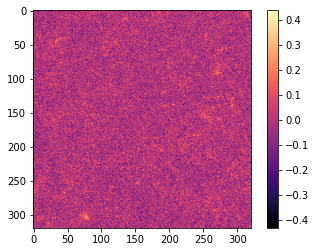

In [229]:
noise =0.1
init_image=( batch['x'][0].reshape((1,320,320)) + noise*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
imshow(init_image.reshape((320,320)), cmap='magma')
colorbar()

(1, 320, 320, 1) (1, 320, 320, 2)


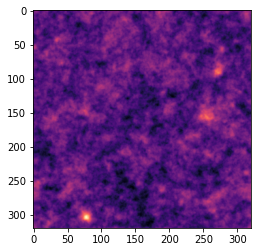

In [219]:
imshow(init_image.reshape((320,320)) + noise**2 * score_fn(init_image, noise*jnp.ones([1])).reshape((320,320)), cmap='magma');

In [231]:
import jax.numpy as jnp
import tensorflow_probability as tfp; tfp = tfp.experimental.substrates.jax
from jax_lensing.samplers.score_samplers import ScoreHamiltonianMonteCarlo, ScoreMetropolisAdjustedLangevinAlgorithm
from jax_lensing.samplers.tempered_sampling import TemperedMC

In [232]:
s0 = 0.1
def make_kernel_fn(target_log_prob_fn, target_score_fn, sigma):
  return ScoreHamiltonianMonteCarlo(
      target_log_prob_fn=target_log_prob_fn,
      target_score_fn=target_score_fn,
      step_size=0.0025*(np.max(sigma)/s0)**0.5,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

tmc = TemperedMC(
            target_score_fn=score_fn,
            inverse_temperatures=s0*np.ones([1]),
            make_kernel_fn=make_kernel_fn,
            gamma=0.98,
            min_steps_per_temp=10,
            num_delta_logp_steps=4)

num_results = int(5000)
num_burnin_steps = int(0)

samples, trace = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=init_image,
        kernel=tmc,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=0,
        trace_fn=lambda _, pkr: (pkr.pre_tempering_results.is_accepted,
                                 pkr.post_tempering_inverse_temperatures,
                                 pkr.tempering_log_accept_ratio),
        seed=jax.random.PRNGKey(0))

/local/home/flanusse/.local/lib/python3.8/site-packages/jax/lax/lax.py:6193: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  warnings.warn(msg.format(dtype, fun_name , truncated_dtype))


[Traced<ShapedArray(float32[1,102400]):JaxprTrace(level=1/0)>]
(1, 320, 320, 1) (1, 320, 320, 2)
(1, 320, 320, 1) (1, 320, 320, 2)
(1, 320, 320, 1) (1, 320, 320, 2)


Text(0.5, 1.0, 'accept tempering')

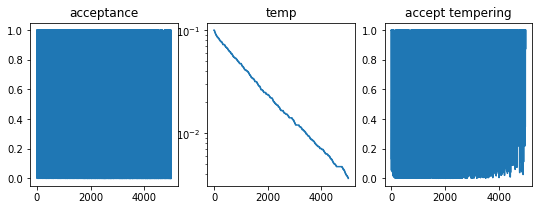

In [233]:
figure(figsize=(9,3))
subplot(131)
plot(trace[0]);
title('acceptance')
subplot(132)
plot(trace[1]);
yscale('log')
title('temp')
subplot(133)
plot(clip(exp(trace[2]),0,1));
title('accept tempering')

In [234]:
mean(trace[0])

DeviceArray(0.48680001, dtype=float32)

In [243]:
trace[1][-1]

DeviceArray([0.0036398], dtype=float32)

Text(0.5, 1.0, 'Annealed under Hybrid prior')

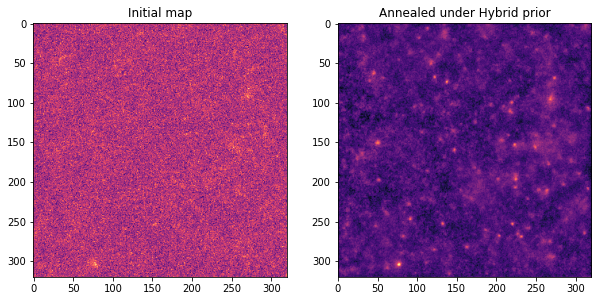

In [237]:
figure(figsize=[10,5])
subplot(121)
imshow(samples[0].reshape((320,320)), cmap='magma')
title('Initial map')
subplot(122)
imshow(samples[-1].reshape((320,320)), cmap='magma')
title('Annealed under Hybrid prior')

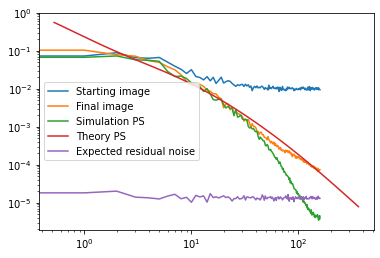

In [244]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Starting image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Simulation PS')
loglog(kell*320,ps_halofit, label='Theory PS')
loglog(measure_power_spectrum( trace[1][-1]*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')

legend()

In [245]:
s0 = 0.1
def make_kernel_fn(target_log_prob_fn, target_score_fn, sigma):
  return ScoreHamiltonianMonteCarlo(
      target_log_prob_fn=target_log_prob_fn,
      target_score_fn=target_score_fn,
      step_size=0.0025*(np.max(sigma)/s0)**0.5,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

tmc = TemperedMC(
            target_score_fn=score_fn,
            inverse_temperatures=s0*np.ones([1]),
            make_kernel_fn=make_kernel_fn,
            gamma=0.98,
            min_steps_per_temp=20,
            num_delta_logp_steps=4)

num_results = int(5000)
num_burnin_steps = int(0)

samples, trace = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=init_image,
        kernel=tmc,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=0,
        trace_fn=lambda _, pkr: (pkr.pre_tempering_results.is_accepted,
                                 pkr.post_tempering_inverse_temperatures,
                                 pkr.tempering_log_accept_ratio),
        seed=jax.random.PRNGKey(0))

/local/home/flanusse/.local/lib/python3.8/site-packages/jax/lax/lax.py:6193: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  warnings.warn(msg.format(dtype, fun_name , truncated_dtype))


[Traced<ShapedArray(float32[1,102400]):JaxprTrace(level=1/0)>]


Text(0.5, 1.0, 'accept tempering')

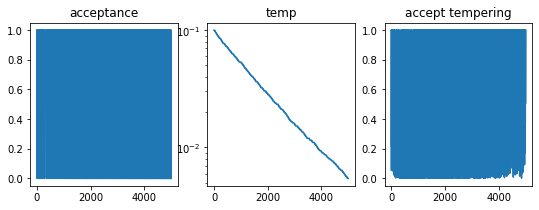

In [246]:
figure(figsize=(9,3))
subplot(131)
plot(trace[0]);
title('acceptance')
subplot(132)
plot(trace[1]);
yscale('log')
title('temp')
subplot(133)
plot(clip(exp(trace[2]),0,1));
title('accept tempering')

Text(0.5, 1.0, 'Annealed under Hybrid prior')

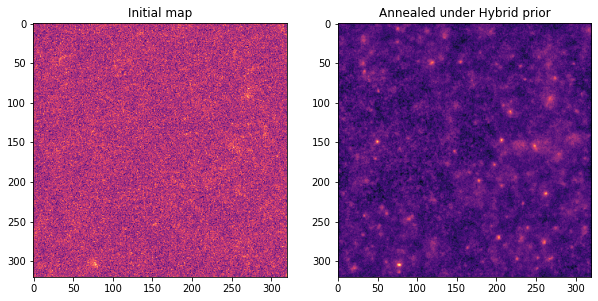

In [247]:
figure(figsize=[10,5])
subplot(121)
imshow(samples[0].reshape((320,320)), cmap='magma')
title('Initial map')
subplot(122)
imshow(samples[-1].reshape((320,320)), cmap='magma')
title('Annealed under Hybrid prior')

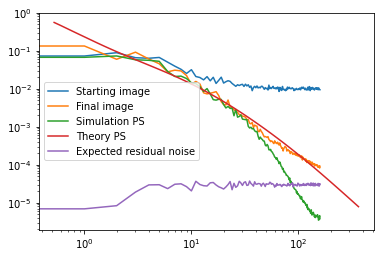

In [248]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Starting image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Simulation PS')
loglog(kell*320,ps_halofit, label='Theory PS')
loglog(measure_power_spectrum( trace[1][-1]*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')

legend()

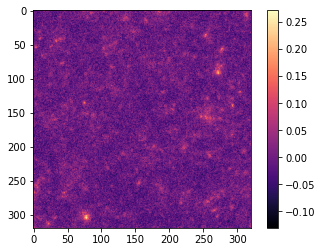

In [257]:
noise =0.03
init_image=( batch['x'][0].reshape((1,320,320)) + noise*randn(1,320,320)).reshape((-1, 320*320,)).astype('float32')
imshow(init_image.reshape((320,320)), cmap='magma')
colorbar()

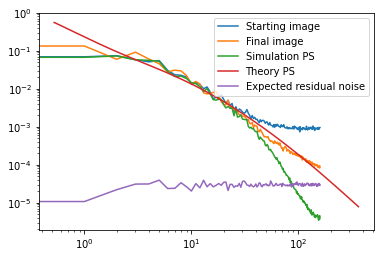

In [258]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Starting image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Simulation PS')
loglog(kell*320,ps_halofit, label='Theory PS')
loglog(measure_power_spectrum( trace[1][-1]*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')

legend()

In [259]:
s0 = 0.1
def make_kernel_fn(target_log_prob_fn, target_score_fn, sigma):
  return ScoreHamiltonianMonteCarlo(
      target_log_prob_fn=target_log_prob_fn,
      target_score_fn=target_score_fn,
      step_size=0.0025*(np.max(sigma)/s0)**0.5,
      num_leapfrog_steps=3,
      num_delta_logp_steps=4)

s0 = 0.03
tmc = TemperedMC(
            target_score_fn=score_fn,
            inverse_temperatures=s0*np.ones([1]),
            make_kernel_fn=make_kernel_fn,
            gamma=0.98,
            min_steps_per_temp=10000,
            num_delta_logp_steps=4)

num_results = int(5000)
num_burnin_steps = int(0)

samples, trace = tfp.mcmc.sample_chain(
        num_results=num_results,
        current_state=init_image,
        kernel=tmc,
        num_burnin_steps=num_burnin_steps,
        num_steps_between_results=0,
        trace_fn=lambda _, pkr: (pkr.pre_tempering_results.is_accepted,
                                 pkr.post_tempering_inverse_temperatures,
                                 pkr.tempering_log_accept_ratio),
        seed=jax.random.PRNGKey(0))

/local/home/flanusse/.local/lib/python3.8/site-packages/jax/lax/lax.py:6193: UserWarning: Explicitly requested dtype float64 requested in astype is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  warnings.warn(msg.format(dtype, fun_name , truncated_dtype))


[Traced<ShapedArray(float32[1,102400]):JaxprTrace(level=1/0)>]


Text(0.5, 1.0, 'accept tempering')

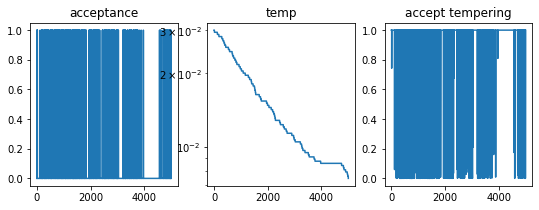

In [260]:
figure(figsize=(9,3))
subplot(131)
plot(trace[0]);
title('acceptance')
subplot(132)
plot(trace[1]);
yscale('log')
title('temp')
subplot(133)
plot(clip(exp(trace[2]),0,1));
title('accept tempering')

Text(0.5, 1.0, 'Annealed under Hybrid prior')

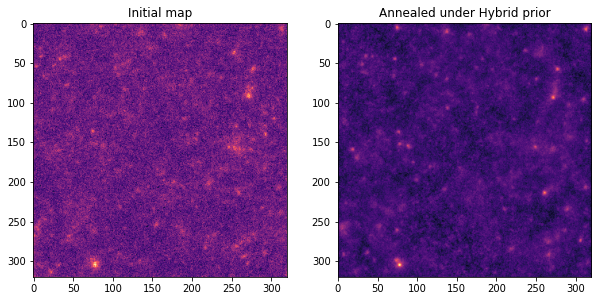

In [261]:
figure(figsize=[10,5])
subplot(121)
imshow(samples[0].reshape((320,320)), cmap='magma')
title('Initial map')
subplot(122)
imshow(samples[-1].reshape((320,320)), cmap='magma')
title('Annealed under Hybrid prior')

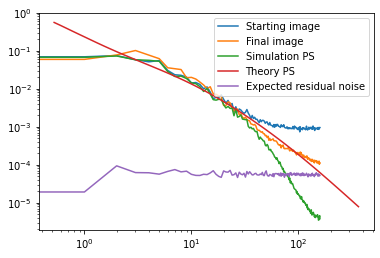

In [262]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Starting image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(measure_power_spectrum(batch['x'][0].reshape((320,320))), label='Simulation PS')
loglog(kell*320,ps_halofit, label='Theory PS')
loglog(measure_power_spectrum( trace[1][-1]*randn(320,320)+ 0*batch['x'][0].reshape((320,320))), label='Expected residual noise')

legend()

Text(0.5, 1.0, 'accept tempering')

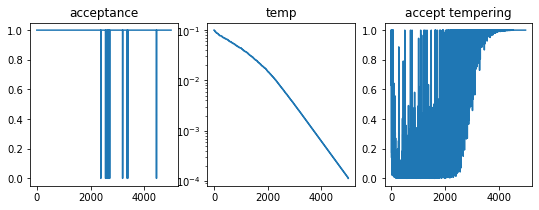

In [222]:
figure(figsize=(9,3))
subplot(131)
plot(trace[0]);
title('acceptance')
subplot(132)
plot(trace[1]);
yscale('log')
title('temp')
subplot(133)
plot(clip(exp(trace[2]),0,1));
title('accept tempering')

In [223]:
mean(trace[0])

DeviceArray(0.99820006, dtype=float32)

Text(0.5, 1.0, 'Annealed under Gaussian prior')

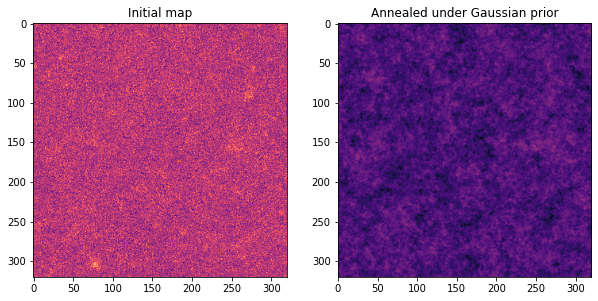

In [227]:
figure(figsize=[10,5])
subplot(121)
imshow(samples[0].reshape((320,320)), cmap='magma')
title('Initial map')
subplot(122)
imshow(samples[-1].reshape((320,320)), cmap='magma',vmax=batch['x'][0].max())
title('Annealed under Gaussian prior')

Text(0.5, 1.0, 'accept tempering')

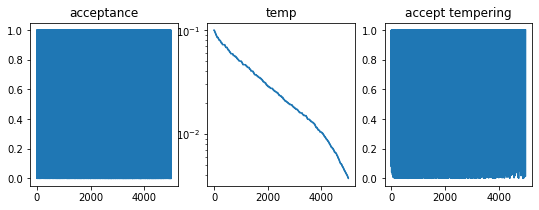

In [199]:
figure(figsize=(9,3))
subplot(131)
plot(trace[0]);
title('acceptance')
subplot(132)
plot(trace[1]);
yscale('log')
title('temp')
subplot(133)
plot(clip(exp(trace[2]),0,1));
title('accept tempering')

In [198]:
mean(trace[0])

DeviceArray(0.48700002, dtype=float32)

Text(0.5, 1.0, 'Annealed under Gaussian prior')

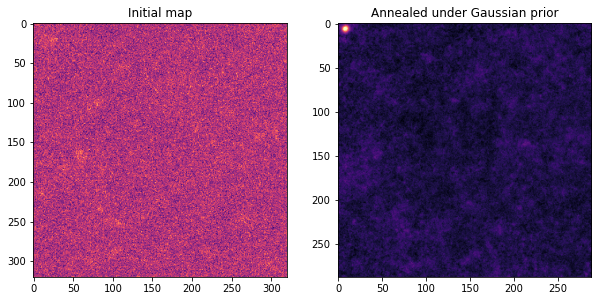

In [203]:
figure(figsize=[10,5])
subplot(121)
imshow(samples[0].reshape((320,320)), cmap='magma')
title('Initial map')
subplot(122)
imshow(samples[-1].reshape((320,320))[16:-16,16:-16], cmap='magma',vmax=samples[0].max())
title('Annealed under Gaussian prior')

In [201]:
from jax_lensing.spectral import measure_power_spectrum

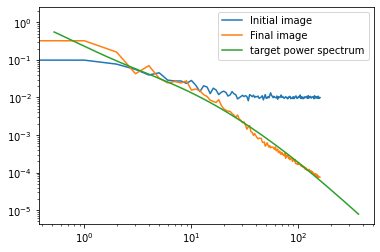

In [202]:
loglog(measure_power_spectrum(init_image.reshape((320,320))), label='Initial image')
loglog(measure_power_spectrum(samples[-1].reshape((320,320))), label='Final image')
loglog(kell*320,ps_halofit, label='target power spectrum')
legend()

Text(0.5, 1.0, 'Annealed under Gaussian prior')

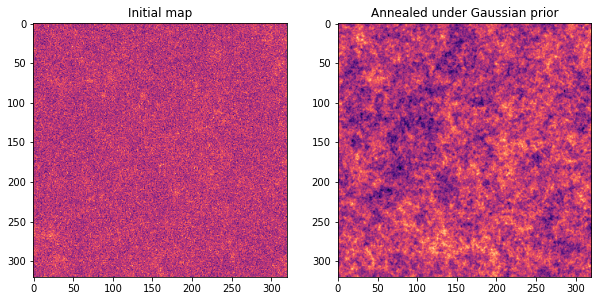

In [48]:
figure(figsize=[10,5])
subplot(121)
imshow(samples[0].reshape((320,320)), cmap='magma')
title('Initial map')
subplot(122)
imshow(samples[-1].reshape((320,320)), cmap='magma')
title('Annealed under Gaussian prior')